In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

bitcoin = pd.read_csv('BTC-EUR.csv')
bitcoin.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2014-09-17,359.546204,361.468506,351.586884,355.957367,355.957367,16389165
1,2014-09-18,355.588409,355.505402,319.789459,328.539368,328.539368,26691849
2,2014-09-19,328.278503,330.936707,298.921021,307.761139,307.761139,29560102
3,2014-09-20,307.665253,329.978180,303.931244,318.758972,318.758972,28736825
4,2014-09-21,318.120514,321.504517,306.502197,310.632446,310.632446,20702624


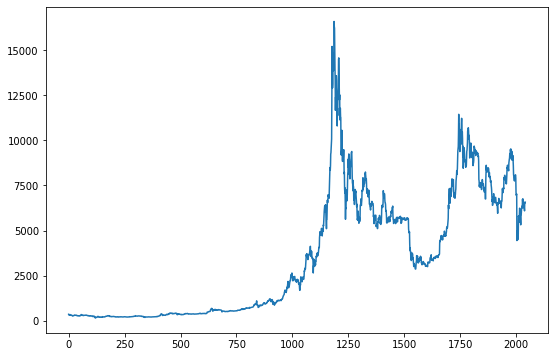

In [3]:
bitcoin['Close'].plot(figsize=(9, 6))
plt.show()

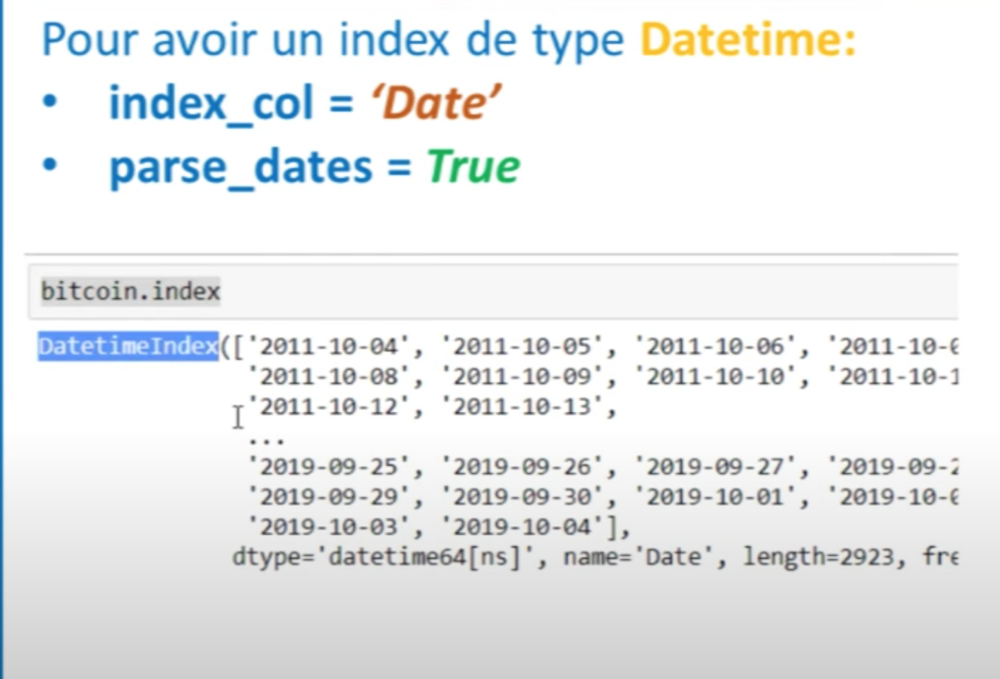

In [4]:
# afficher les index actuel
bitcoin.index

RangeIndex(start=0, stop=2041, step=1)

In [6]:
# on définit la colonne date comme la colonn indes et on définit que ce sera des objets Datetime 
bitcoin = pd.read_csv('BTC-EUR.csv', index_col='Date', parse_dates=True)
bitcoin.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2014-09-17,359.546204,361.468506,351.586884,355.957367,355.957367,16389165
2014-09-18,355.588409,355.505402,319.789459,328.539368,328.539368,26691849
2014-09-19,328.278503,330.936707,298.921021,307.761139,307.761139,29560102
2014-09-20,307.665253,329.978180,303.931244,318.758972,318.758972,28736825
2014-09-21,318.120514,321.504517,306.502197,310.632446,310.632446,20702624


In [7]:
bitcoin.index

DatetimeIndex(['2014-09-17', '2014-09-18', '2014-09-19', '2014-09-20',
               '2014-09-21', '2014-09-22', '2014-09-23', '2014-09-24',
               '2014-09-25', '2014-09-26',
               ...
               '2020-04-09', '2020-04-10', '2020-04-11', '2020-04-12',
               '2020-04-13', '2020-04-14', '2020-04-15', '2020-04-16',
               '2020-04-17', '2020-04-18'],
              dtype='datetime64[ns]', name='Date', length=2041, freq=None)

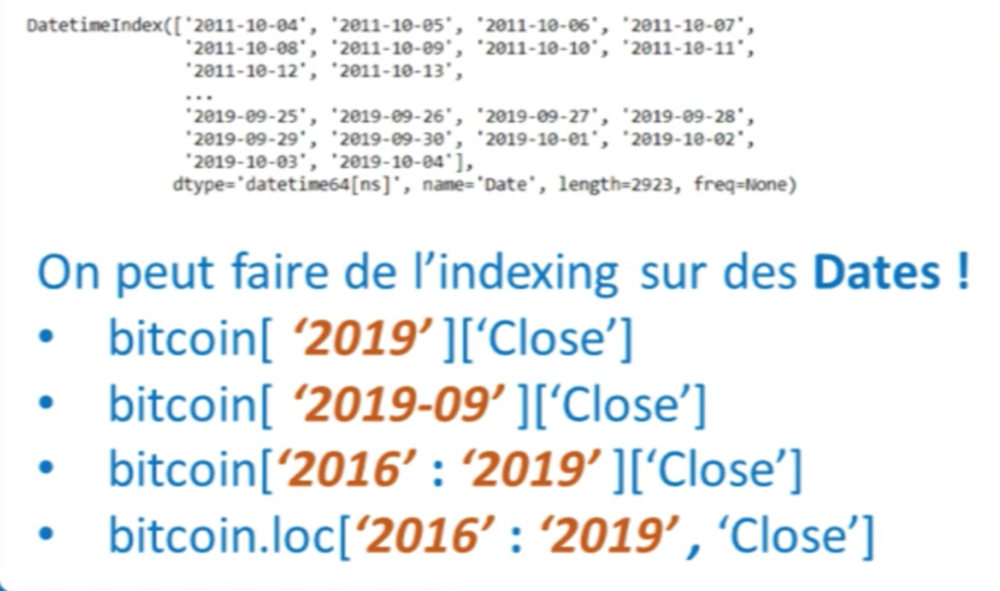

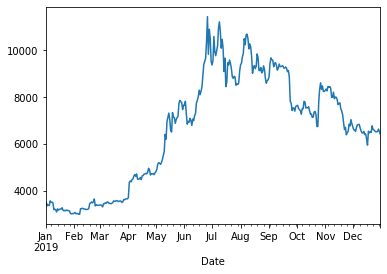

In [8]:
# Évolution du bitcoin en 2019
bitcoin['2019']['Close'].plot()

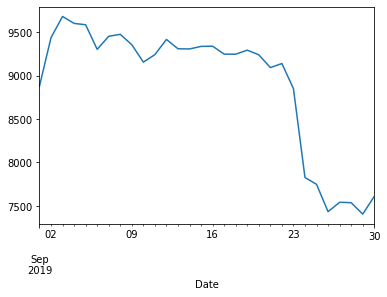

In [9]:
# Évolution du bitcoin en septembre 2019
bitcoin['2019-09']['Close'].plot()

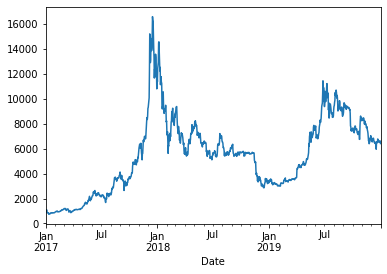

In [10]:
# bitcoin.loc['2017':'2019']['Close'].plot()
bitcoin['2017':'2019']['Close'].plot()

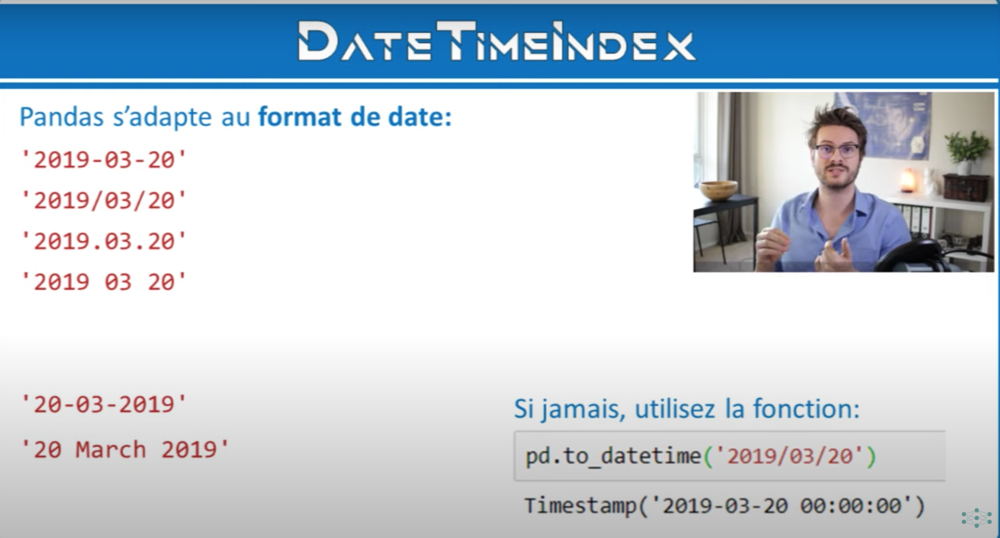

# regrouper les données selon une fréquence

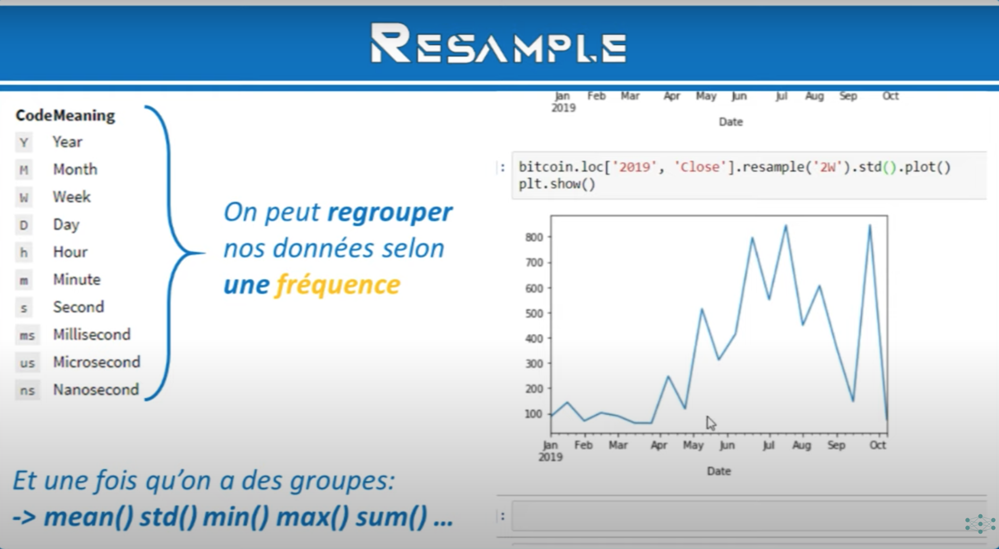

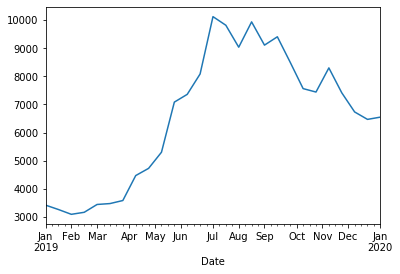

In [14]:
# on affiche su le cours de l'année 2019 acex des graduations toutes les deux semaine dans l'axe des abscisses
bitcoin.loc['2019' , 'Close'].resample('2W').mean().plot()
plt.show()

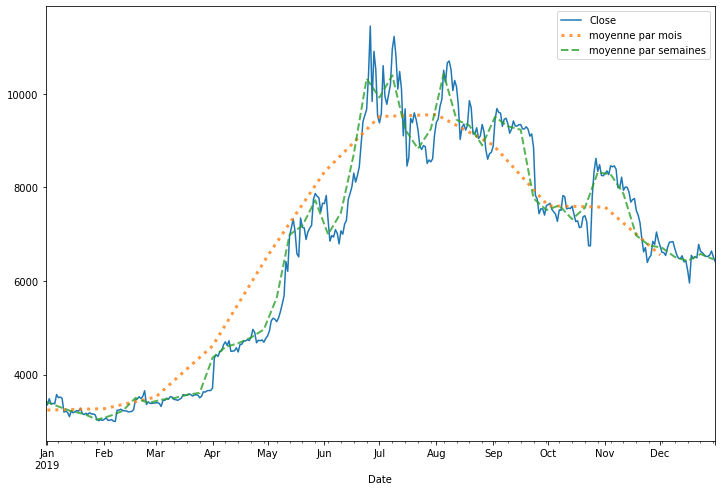

In [15]:
plt.figure(figsize=(12, 8))
bitcoin.loc['2019', 'Close'].plot()
bitcoin.loc['2019', 'Close'].resample('M').mean().plot(label='moyenne par mois', lw=3, ls=':', alpha=0.8)
bitcoin.loc['2019', 'Close'].resample('W').mean().plot(label='moyenne par semaines', lw=2, ls='--', alpha=0.8)
plt.legend()
plt.show()

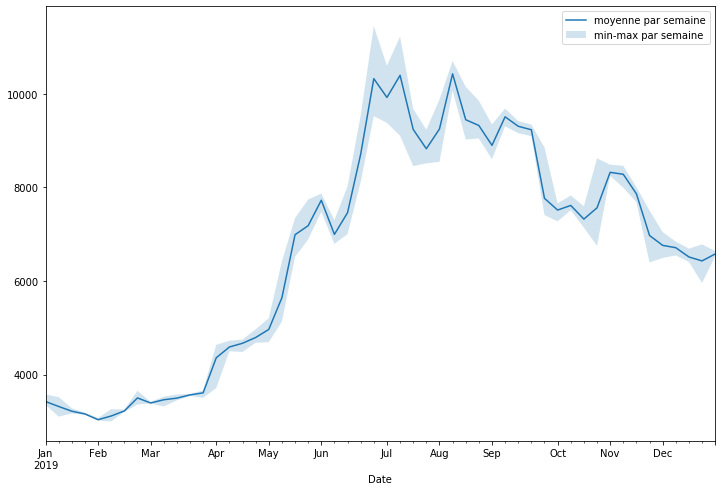

In [17]:
# on utilise agregate pour réunir plusieurs statistiques dans une même courbe
m = bitcoin.loc['2019', 'Close'].resample('W').agg(['mean', 'std', 'min', 'max'])

plt.figure(figsize=(12, 8))
# on affiche que la moyenne dans notre tableau mais on voit qu'on va pouvoir utiliser les autres stats
m['mean']['2019'].plot(label='moyenne par semaine')
# permet de créer une zone d'incertitude entre le maximum et le minimum pour chaque semaine
plt.fill_between(m.index, m['max'], m['min'], alpha=0.2, label='min-max par semaine')

plt.legend()
plt.show()

# Rolling

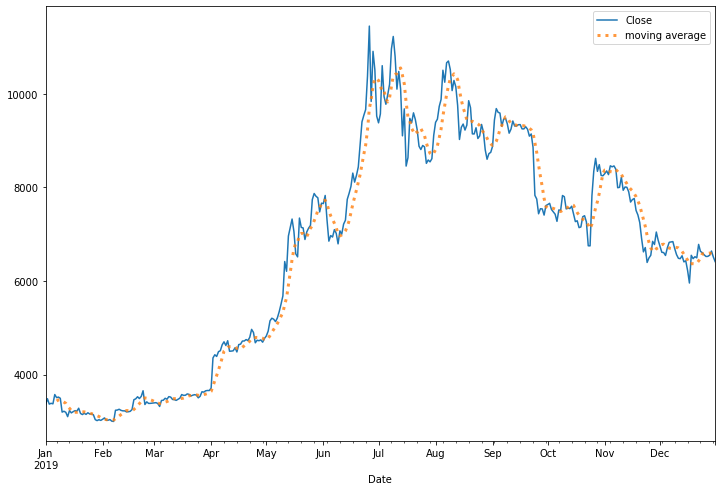

In [45]:
plt.figure(figsize=(12, 8))
bitcoin = pd.read_csv('BTC-EUR.csv', index_col='Date', parse_dates=True)
bitcoin.loc['2019', 'Close'].plot()
# on prend une fenêtre de 7 jours, on regarde tous les nombres et on en fait la moyenne
bitcoin.loc['2019', 'Close'].rolling(window=7).mean().plot(label='moving average', lw=3, ls=':', alpha=0.8)
plt.legend()
plt.show()

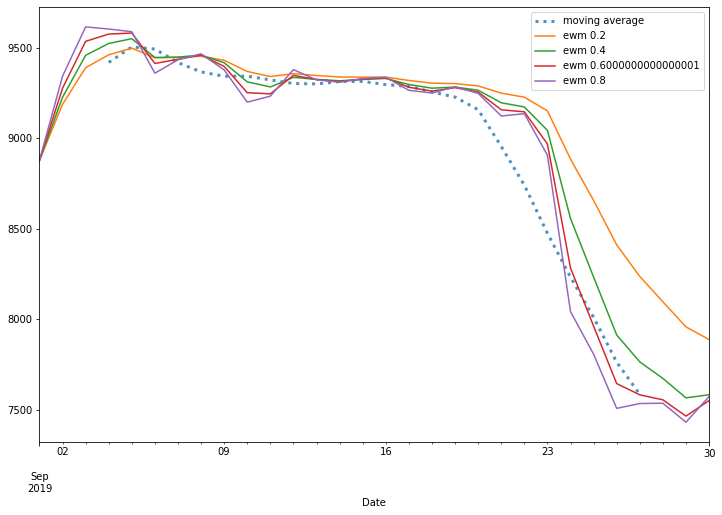

In [27]:
# on peut utiliser une autre manière de faire cette moyenne que l'on va nommer ewm(): Exponential weigthed function
plt.figure(figsize=(12, 8))
bitcoin.loc['2019-09', 'Close'].rolling(window=7, center=True).mean().plot(label='moving average', lw=3, ls=':', alpha=0.8)
for i in np.arange(0.2, 1, 0.2):
    bitcoin.loc['2019-09', 'Close'].ewm(alpha=i).mean().plot(label=f'ewm {i}')

plt.legend()
plt.show()

# Concaténer des tableaux avec Panda

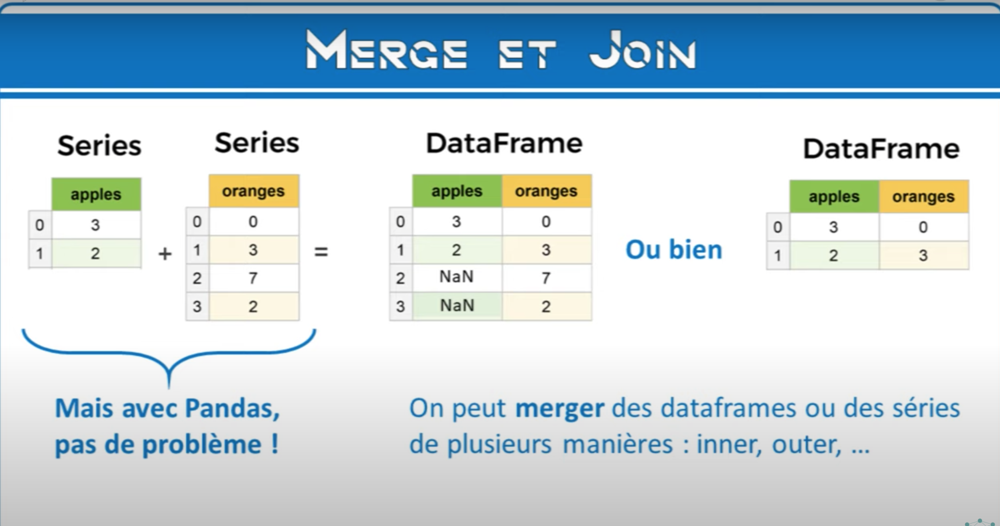

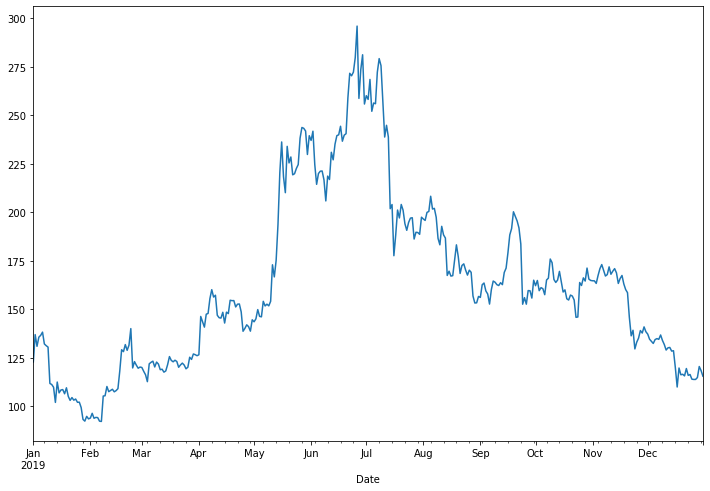

In [31]:
ethereum = pd.read_csv('ETH-EUR.csv', index_col='Date', parse_dates=True)
plt.figure(figsize=(12, 8))
ethereum['2019']['Close'].plot()

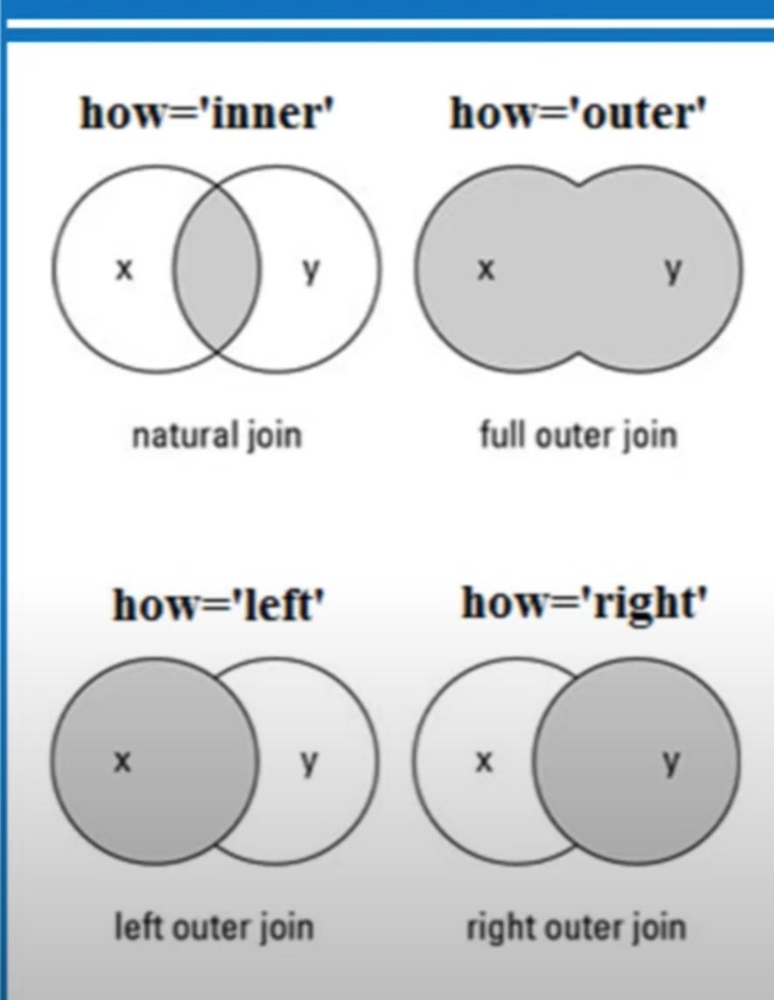

In [33]:
pd.merge(bitcoin, ethereum, on='Date', how='inner')

,Open_x,High_x,Low_x,Close_x,Adj Close_x,Volume_x,Open_y,High_y,Low_y,Close_y,Adj Close_y,Volume_y
Date,,,,,,,,,,,,
2015-08-07,255.233948,255.762100,253.128769,254.840027,254.840027,38724637,2.592821,3.231847,2.299453,2.526771,2.526771,149784
2015-08-08,254.983139,255.152679,237.635574,237.897186,237.897186,53352474,2.546495,2.551098,0.651468,0.686651,0.686651,614518
2015-08-09,238.005646,243.371613,237.414993,241.952362,241.952362,21713764,0.643639,0.801941,0.573504,0.640651,0.640651,485733
2015-08-10,242.312881,243.509033,239.726135,240.143463,240.143463,19049668,0.651688,0.662660,0.579996,0.643283,0.643283,368004
2015-08-11,240.027252,244.892654,240.676193,244.892654,244.892654,23035866,0.642956,1.024735,0.604369,0.967177,0.967177,1325151
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-04-14,6265.797852,6342.717773,6223.812988,6229.045410,6229.045410,31052638301,143.161545,146.761215,142.708679,143.468826,143.468826,13403313977
2020-04-15,6231.897949,6313.766113,6083.400879,6091.080566,6091.080566,29609672747,143.440826,146.592819,140.158401,140.570206,140.570206,12996065046
2020-04-16,6089.562012,6570.778809,6018.864258,6554.135254,6554.135254,43084465667,140.490906,159.533081,138.125580,158.546280,158.546280,21099121716


In [34]:
#changer les suffixes à la place de x et y
pd.merge(bitcoin, ethereum, on='Date', how='inner', suffixes=('_btc', '_eth'))

,Open_btc,High_btc,Low_btc,Close_btc,Adj Close_btc,Volume_btc,Open_eth,High_eth,Low_eth,Close_eth,Adj Close_eth,Volume_eth
Date,,,,,,,,,,,,
2015-08-07,255.233948,255.762100,253.128769,254.840027,254.840027,38724637,2.592821,3.231847,2.299453,2.526771,2.526771,149784
2015-08-08,254.983139,255.152679,237.635574,237.897186,237.897186,53352474,2.546495,2.551098,0.651468,0.686651,0.686651,614518
2015-08-09,238.005646,243.371613,237.414993,241.952362,241.952362,21713764,0.643639,0.801941,0.573504,0.640651,0.640651,485733
2015-08-10,242.312881,243.509033,239.726135,240.143463,240.143463,19049668,0.651688,0.662660,0.579996,0.643283,0.643283,368004
2015-08-11,240.027252,244.892654,240.676193,244.892654,244.892654,23035866,0.642956,1.024735,0.604369,0.967177,0.967177,1325151
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-04-14,6265.797852,6342.717773,6223.812988,6229.045410,6229.045410,31052638301,143.161545,146.761215,142.708679,143.468826,143.468826,13403313977
2020-04-15,6231.897949,6313.766113,6083.400879,6091.080566,6091.080566,29609672747,143.440826,146.592819,140.158401,140.570206,140.570206,12996065046
2020-04-16,6089.562012,6570.778809,6018.864258,6554.135254,6554.135254,43084465667,140.490906,159.533081,138.125580,158.546280,158.546280,21099121716


In [35]:
# avec outer on retrouve aussi les données que les deux ne partages pas donc les dates ici pas présente pour l'ethereum
pd.merge(bitcoin, ethereum, on='Date', how='outer', suffixes=('_btc', '_eth'))

,Open_btc,High_btc,Low_btc,Close_btc,Adj Close_btc,Volume_btc,Open_eth,High_eth,Low_eth,Close_eth,Adj Close_eth,Volume_eth
Date,,,,,,,,,,,,
2014-09-17,359.546204,361.468506,351.586884,355.957367,355.957367,16389165,NaN,NaN,NaN,NaN,NaN,NaN
2014-09-18,355.588409,355.505402,319.789459,328.539368,328.539368,26691849,NaN,NaN,NaN,NaN,NaN,NaN
2014-09-19,328.278503,330.936707,298.921021,307.761139,307.761139,29560102,NaN,NaN,NaN,NaN,NaN,NaN
2014-09-20,307.665253,329.978180,303.931244,318.758972,318.758972,28736825,NaN,NaN,NaN,NaN,NaN,NaN
2014-09-21,318.120514,321.504517,306.502197,310.632446,310.632446,20702624,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2020-04-14,6265.797852,6342.717773,6223.812988,6229.045410,6229.045410,31052638301,143.161545,146.761215,142.708679,143.468826,143.468826,1.340331e+10
2020-04-15,6231.897949,6313.766113,6083.400879,6091.080566,6091.080566,29609672747,143.440826,146.592819,140.158401,140.570206,140.570206,1.299607e+10
2020-04-16,6089.562012,6570.778809,6018.864258,6554.135254,6554.135254,43084465667,140.490906,159.533081,138.125580,158.546280,158.546280,2.109912e+10


array([<matplotlib.axes._subplots.AxesSubplot object at 0x122e1bc10>,
      dtype=object)

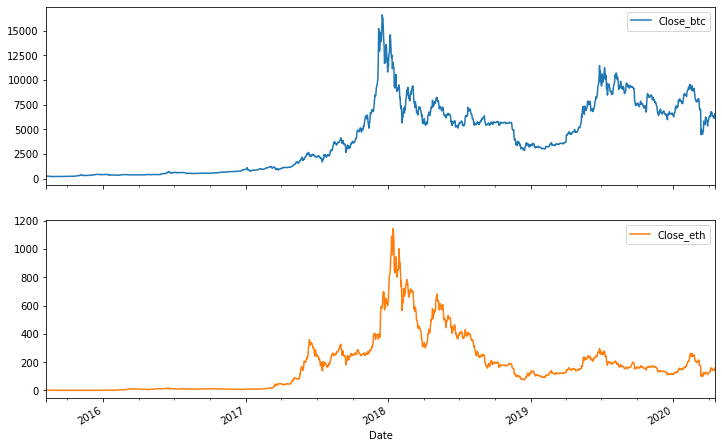

In [39]:
# maintenant on affiche nos courbes sous forme de graphique
btc_eth = pd.merge(bitcoin, ethereum, on='Date', how='inner', suffixes=('_btc', '_eth'))
btc_eth[['Close_btc', 'Close_eth']].plot(subplots=True, figsize=(12, 8))

In [40]:
btc_eth[['Close_btc', 'Close_eth']].corr()
# on peut voir que les datasets sont très semblable, un taux de corrélation de 73%

,Close_btc,Close_eth
Close_btc,1.000000,0.734485
Close_eth,0.734485,1.000000


# EXERCICE

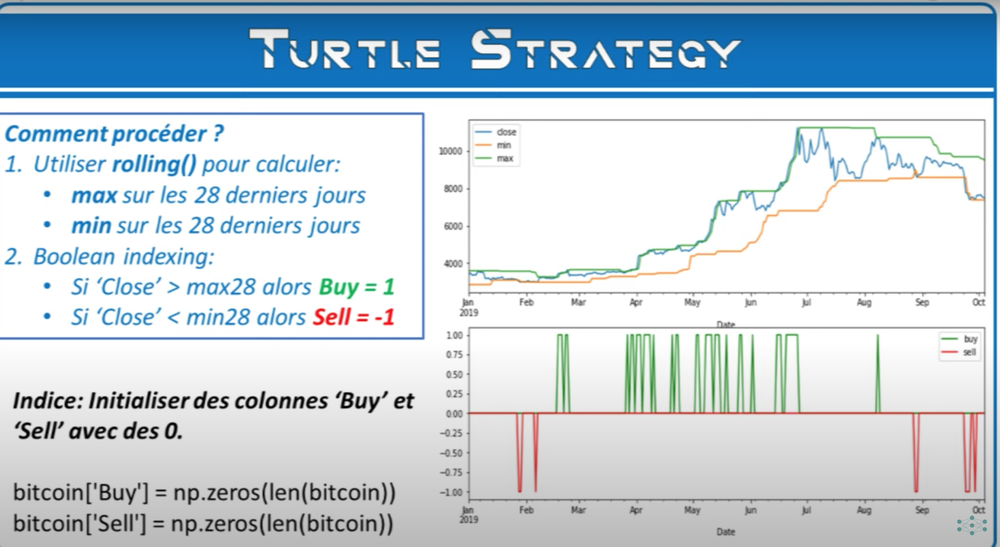

In [51]:
# copie du dataframe
data = bitcoin.copy()
# pour avoir la ligne horizontal quand il ne faut pas vendre
data['Buy'] = np.zeros(len(data))
data['Sell'] = np.zeros(len(data))

In [52]:
# dans ces 28 jours on cherche le maximum et le minimum sur une fenêtre de 28 jours
# avec shift(1) on décale le signal de 1 jours car sinon on ne vend pas et on achète pas car on ne peut anticiper
data['RollingMax'] = data['Close'].shift(1).rolling(window=28).max()
data['RollingMin'] = data['Close'].shift(1).rolling(window=28).min()

# on remplace dans nos matrices quin n'ont que des zéros les valeurs par des 1
data.loc[data['RollingMax'] < data['Close'], 'Buy'] = 1
data.loc[data['RollingMin'] > data['Close'], 'Sell'] = -1

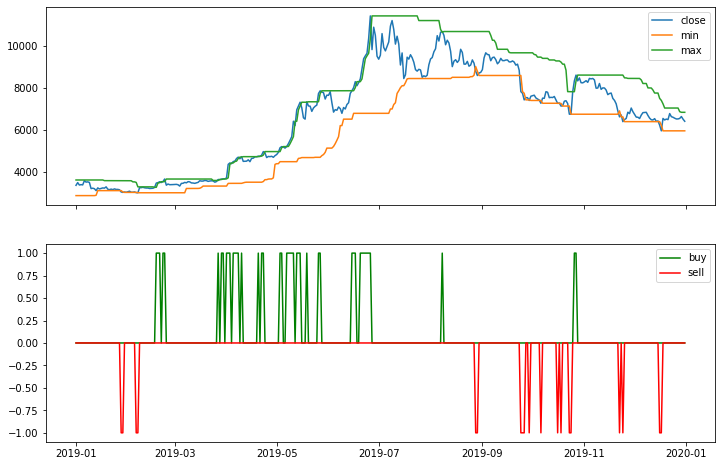

In [53]:
start = '2019'
end = '2019'
# méthodes orientée objet de matplotlib pour faire des zooms sur les deux graphiques en même temps
fig, ax = plt.subplots(2, figsize=(12, 8), sharex=True)
ax[0].plot(data['Close'][start:end])
ax[0].plot(data['RollingMin'][start:end])
ax[0].plot(data['RollingMax'][start:end])
ax[0].legend(['close', 'min', 'max'])
ax[1].plot(data['Buy'][start:end], c='g')
ax[1].plot(data['Sell'][start:end], c='r')
ax[1].legend(['buy', 'sell'])
